In [3]:
!pip uninstall torch torchvision torchaudio --yes
!pip uninstall numpy

Found existing installation: torch 2.5.1+cu121
Uninstalling torch-2.5.1+cu121:
  Successfully uninstalled torch-2.5.1+cu121
Found existing installation: torchvision 0.20.1+cu121
Uninstalling torchvision-0.20.1+cu121:
  Successfully uninstalled torchvision-0.20.1+cu121
Found existing installation: torchaudio 2.5.1+cu121
Uninstalling torchaudio-2.5.1+cu121:
  Successfully uninstalled torchaudio-2.5.1+cu121
Found existing installation: numpy 1.26.0
Uninstalling numpy-1.26.0:
  Would remove:
    /usr/local/bin/f2py
    /usr/local/lib/python3.11/dist-packages/numpy-1.26.0.dist-info/*
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libgfortran-040039e1.so.5.0.0
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libopenblas64_p-r0-0cf96a72.3.23.dev.so
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libquadmath-96973f99.so.0.0.0
    /usr/local/lib/python3.11/dist-packages/numpy/*
Proceed (Y/n)? y
  Successfully uninstalled numpy-1.26.0


In [4]:
!pip install numpy==1.26.0
!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1 --index-url https://download.pytorch.org/whl/cu121

  Using cached numpy-1.26.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (58 kB)
Using cached numpy-1.26.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
accelerate 1.5.2 requires torch>=2.0.0, which is not installed.
sentence-transformers 3.4.1 requires torch>=1.11.0, which is not installed.
peft 0.14.0 requires torch>=1.13.0, which is not installed.
fastai 2.7.19 requires torch<2.7,>=1.10, which is not installed.
fastai 2.7.19 requires torchvision>=0.11, which is not installed.
Looking in indexes: https://download.pytorch.org/whl/cu121
  Using cached https://download.pytorch.org/whl/cu121/torch-2.5.1%2Bcu121-cp311-cp311-linux_x86_64.whl (780.5 MB)
  Using cached https://download.pytorch.org/whl/cu121/torchvision-0.20.1%2Bcu121-cp311-cp311-linux_x86_64.whl (7.3 MB)
  U

In [1]:
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())

PyTorch version: 2.5.1+cu121
Torchvision version: 0.20.1+cu121
CUDA is available: True


In [ ]:
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/Pintu587/sam2'

!mkdir -p images
!wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
!wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/groceries.jpg

!mkdir -p ../checkpoints/
!wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

PyTorch version: 2.5.1+cu121
Torchvision version: 0.20.1+cu121
CUDA is available: True
  Cloning https://github.com/Pintu587/sam2 to /tmp/pip-req-build-ny047nbv
  Running command git clone --filter=blob:none --quiet https://github.com/Pintu587/sam2 /tmp/pip-req-build-ny047nbv
  Resolved https://github.com/Pintu587/sam2 to commit 2b7bcf7a4ea6206cef7a55d1c6035099c871d338
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.7 MB/s eta 0:00:00
  Created wheel for SAM-2: filename=sam_2-1.0-cp311-cp311-linux_x86_64.whl size=471001 sha

In [3]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [4]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [5]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [6]:
image = Image.open('images/truck.jpg')
image = np.array(image.convert("RGB"))

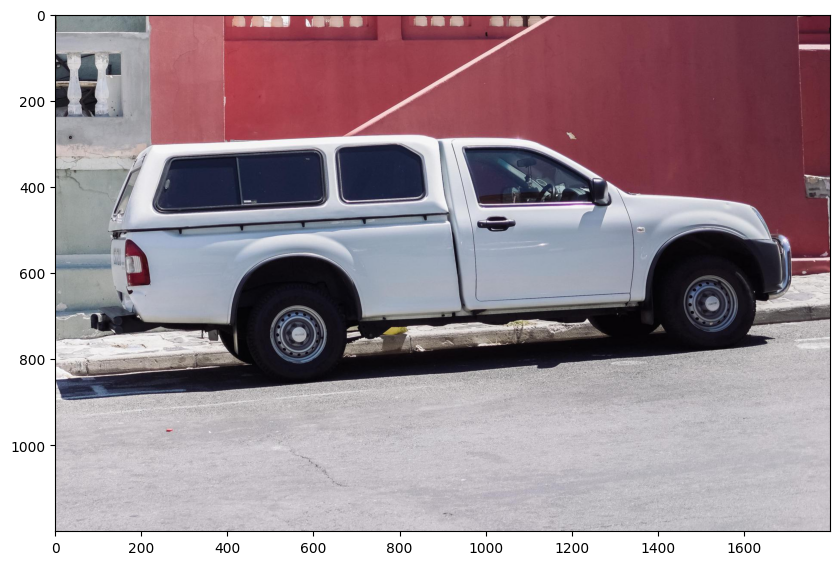

In [7]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [8]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint,device = "cpu")

predictor = SAM2ImagePredictor(sam2_model)

In [ ]:
predictor.set_image(image)

In [ ]:
input_point = np.array([[800, 600]])
input_label = np.array([1])

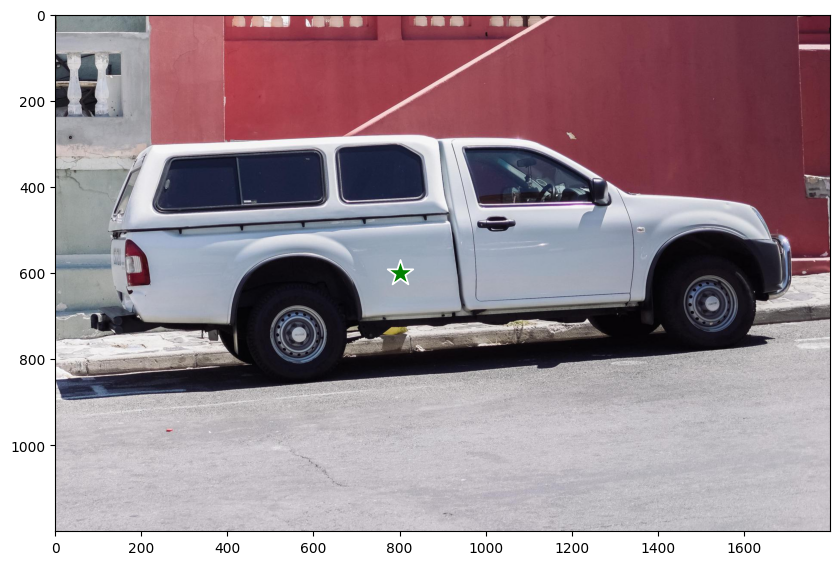

In [11]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [12]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


In [13]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

In [14]:
masks.shape  # (number_of_masks) x H x W

(3, 1200, 1800)

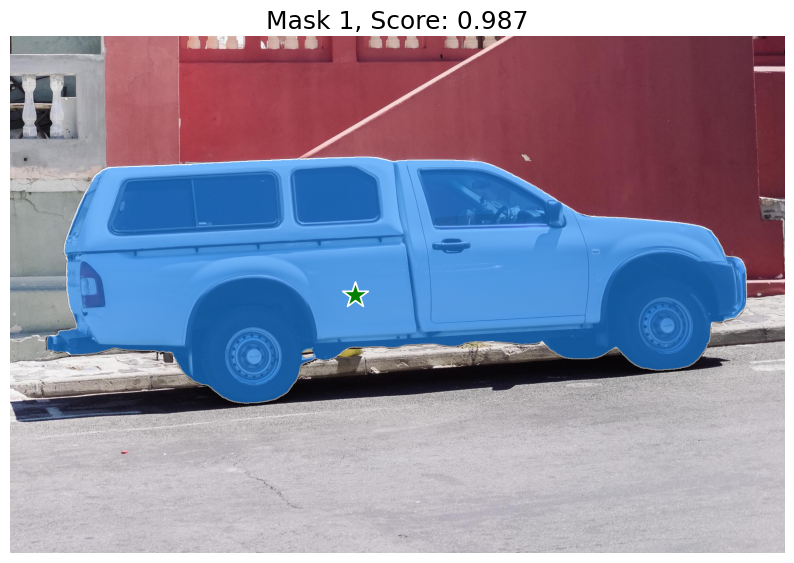

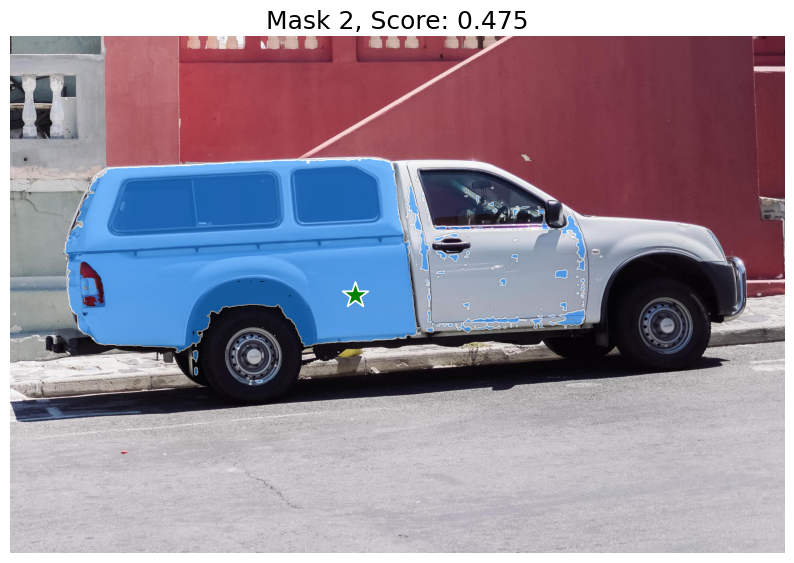

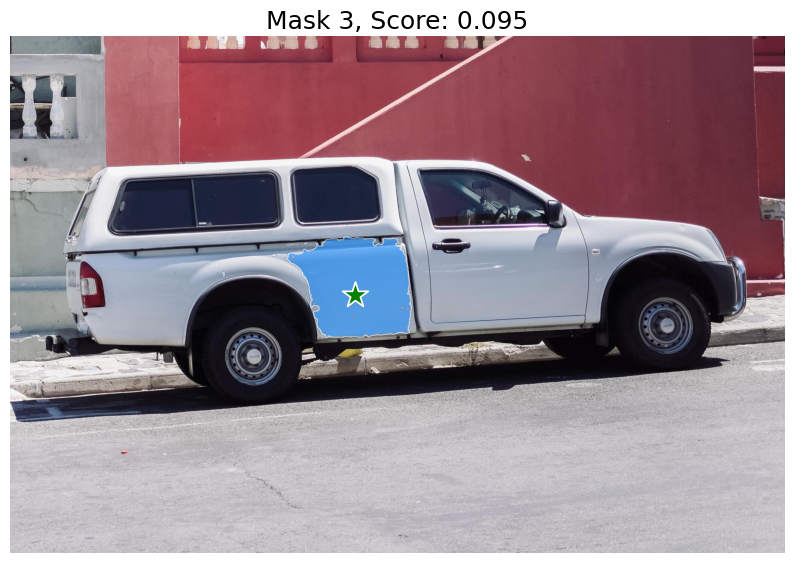

In [15]:
show_masks(image, masks, scores, point_coords=input_point, input_labels=input_label, borders=True)

In [16]:
import cv2
import numpy as np
from PIL import Image
from typing import Any, Dict, List


def load_img_to_array(img_p):
    img = Image.open(img_p)
    if img.mode == "RGBA":
        img = img.convert("RGB")
    return np.array(img)

def save_array_to_img(img_arr, img_p):
    Image.fromarray(img_arr.astype(np.uint8)).save(img_p)


def dilate_mask(mask, dilate_factor=15):
    mask = mask.astype(np.uint8)
    mask = cv2.dilate(
        mask,
        np.ones((dilate_factor, dilate_factor), np.uint8),
        iterations=1
    )
    return mask

def erode_mask(mask, dilate_factor=15):
    mask = mask.astype(np.uint8)
    mask = cv2.erode(
        mask,
        np.ones((dilate_factor, dilate_factor), np.uint8),
        iterations=1
    )
    return mask

def show_mask(ax, mask: np.ndarray, random_color=False):
    mask = mask.astype(np.uint8)
    if np.max(mask) == 255:
        mask = mask / 255
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_img = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_img)


def show_points(ax, coords: List[List[float]], labels: List[int], size=375):
    coords = np.array(coords)
    labels = np.array(labels)
    color_table = {0: 'red', 1: 'green'}
    for label_value, color in color_table.items():
        points = coords[labels == label_value]
        ax.scatter(points[:, 0], points[:, 1], color=color, marker='*',
                   s=size, edgecolor='white', linewidth=1.25)

def get_clicked_point(img_path):
    img = cv2.imread(img_path)
    cv2.namedWindow("image")
    cv2.imshow("image", img)

    last_point = []
    keep_looping = True

    def mouse_callback(event, x, y, flags, param):
        nonlocal last_point, keep_looping, img

        if event == cv2.EVENT_LBUTTONDOWN:
            if last_point:
                cv2.circle(img, tuple(last_point), 5, (0, 0, 0), -1)
            last_point = [x, y]
            cv2.circle(img, tuple(last_point), 5, (0, 0, 255), -1)
            cv2.imshow("image", img)
        elif event == cv2.EVENT_RBUTTONDOWN:
            keep_looping = False

    cv2.setMouseCallback("image", mouse_callback)

    while keep_looping:
        cv2.waitKey(1)

    cv2.destroyAllWindows()

    return last_point

In [22]:
import sys
import argparse
import numpy as np
from pathlib import Path
from matplotlib import pyplot as plt
from typing import Any, Dict, List
import torch
from hydra import initialize, compose
from omegaconf import OmegaConf

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

def predict_masks_with_sam(
        img: np.ndarray,
        point_coords: List[List[float]],
        point_labels: List[int],
        device="cpu",
        refinement_mode=None
):
    point_coords = np.array(point_coords)
    point_labels = np.array(point_labels)

    sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    predictor.set_image(img)

    '''
    Predict with SAM2ImagePredictor.predict. The model returns masks,
    quality predictions for those masks, and low resolution mask logits
    that can be passed to the next iteration of prediction.
    '''

    masks, scores, logits = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True,
    )

    '''
    With multimask_output=True (the default setting), SAM 2 outputs 3 masks,
    where scores gives the model's own estimation of the quality of these masks.
    This setting is intended for ambiguous input prompts, and helps the model
    disambiguate different objects consistent with the prompt
    '''

    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    scores = scores[sorted_ind]
    logits = logits[sorted_ind]

    return masks, scores, logits

In [33]:
import torch
from pathlib import Path
import matplotlib.pyplot as plt

# Define the latest_coords and point_labels as flattened tensors
latest_coords = torch.tensor([[250, 250]], dtype=torch.float32)  # Shape: (1, 2)
point_labels = torch.tensor([1], dtype=torch.int64)  # Shape: (1,)

input_img = '/content/baseball.jpg'
dilate_kernel_size = 15
output_dir = '/content/output'
img_array = load_img_to_array(input_img)

# Set device (can be "cpu" or "cuda")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Predict masks using SAM with corrected inputs
masks, _, _ = predict_masks_with_sam(
    img_array,
    latest_coords.unsqueeze(0),  # Shape: (1, 1, 2)
    point_labels.unsqueeze(0),   # Shape: (1, 1)
    device=device,
)
masks = masks.astype(np.uint8) * 255

# Dilate mask if required
if dilate_kernel_size is not None:
    masks = [dilate_mask(mask, dilate_kernel_size) for mask in masks]

# Prepare output directories
img_stem = Path(input_img).stem
out_dir = Path(output_dir) / img_stem
out_dir.mkdir(parents=True, exist_ok=True)

# Save visualizations and masks
for idx, mask in enumerate(masks):
    mask_p = out_dir / f"mask_{idx}.png"
    img_points_p = out_dir / f"with_points.png"
    img_mask_p = out_dir / f"with_{mask_p.name}"

    save_array_to_img(mask, mask_p)

    dpi = plt.rcParams['figure.dpi']
    height, width = img_array.shape[:2]
    plt.figure(figsize=(width / dpi / 0.77, height / dpi / 0.77))
    plt.imshow(img_array)
    plt.axis('off')

    # Flatten coords and labels for plotting
    show_points(plt.gca(), latest_coords.numpy(), point_labels.numpy(),
                size=(width * 0.04)**2)
    plt.savefig(img_points_p, bbox_inches='tight', pad_inches=0)

    show_mask(plt.gca(), mask, random_color=False)
    plt.savefig(img_mask_p, bbox_inches='tight', pad_inches=0)
    plt.close()

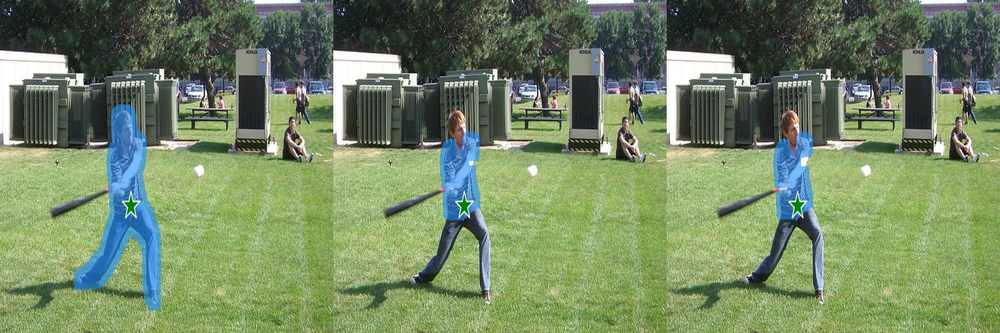

In [34]:
import cv2
import numpy as np
from IPython.display import display, Image as IPImage
from PIL import Image


def show_image_grid_with_cv2(img_paths, cols=3, target_size=(640, 640)):
    """
    Display a grid of images using OpenCV and IPython display, resizing images to the target size.

    Args:
        img_paths (list): List of image paths.
        cols (int): Number of columns in the grid.
        target_size (tuple): Size to which each image will be resized.
    """
    images = []
    for img_path in img_paths:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        img = cv2.resize(img, target_size)  # Resize to target size
        images.append(img)

    n_images = len(images)
    rows = (n_images // cols) + int(n_images % cols != 0)

    # Create a blank canvas for the grid
    img_height, img_width = target_size
    grid_height = img_height * rows
    grid_width = img_width * cols
    grid = np.zeros((grid_height, grid_width, 3), dtype=np.uint8)

    # Place images into the grid
    for idx, img in enumerate(images):
        row = idx // cols
        col = idx % cols
        grid[row * img_height: (row + 1) * img_height, col * img_width: (col + 1) * img_width, :] = img

    # Convert the grid to an image and display it
    grid_image = Image.fromarray(grid)
    display(grid_image)

# def show_image_grid(img_paths):
#     # Create a figure with a grid of 1 row and 3 columns
#     fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust figsize for appropriate scaling

#     for i, img_path in enumerate(img_paths):
#         image = Image.open(img_path)
#         image = np.array(image.convert("RGB"))

#         # Display each image in the grid (1x3)
#         axes[i].imshow(image)
#         axes[i].axis('off')  # Hide axes for cleaner display

#     plt.tight_layout()  # Adjust layout to prevent overlapping
#     plt.show()

# Example usage:
image_paths = ["/content/output/baseball/with_mask_0.png", "/content/output/baseball/with_mask_1.png", "/content/output/baseball/with_mask_2.png"]
show_image_grid_with_cv2(image_paths)

# Lama

In [25]:
!git clone https://github.com/advimman/lama

fatal: destination path 'lama' already exists and is not an empty directory.


In [26]:
!pip install pyyaml
!pip install tqdm
!pip install numpy==1.26.0
!pip install easydict==1.9.0
!pip install opencv-python
!pip install tensorflow
!pip install joblib
!pip install matplotlib
!pip install pandas
!pip install albumentations==0.5.2
!pip install hydra-core==1.3.2
!pip install pytorch-lightning==1.2.9
!pip install scikit-image
!pip install scikit-learn
!pip install tabulate
!pip install kornia==0.5.0
!pip install webdataset
!pip install packaging
!pip install wldhx.yadisk-direct

  Preparing metadata (setup.py) ... done
  Created wheel for easydict: filename=easydict-1.9-py3-none-any.whl size=6345 sha256=941d4f8ecc10eb03f9c9530e665b8ff24f67190bb5d1c9465dc2ed28b4b80558
  Stored in directory: /root/.cache/pip/wheels/37/0d/a4/4a224efd03ae021fd8b33cf88d900d817aec7b2a982950933c
Successfully built easydict
  Attempting uninstall: easydict
    Found existing installation: easydict 1.13
    Uninstalling easydict-1.13:
      Successfully uninstalled easydict-1.13
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 31.9 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.5
    Uninstalling albumentations-2.0.5:
      Successfully uninstalled albumentations-2.0.5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.9/841.9 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.9/176.9 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━

In [27]:
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())

PyTorch version: 2.5.1+cu121
Torchvision version: 0.20.1+cu121
CUDA is available: True


In [28]:
!wget -P /content/Inpaint-Anything/pretrained_models https://huggingface.co/smartywu/big-lama/resolve/main/big-lama.zip

--2025-03-30 12:47:21--  https://huggingface.co/smartywu/big-lama/resolve/main/big-lama.zip
Resolving huggingface.co (huggingface.co)... 3.163.189.90, 3.163.189.37, 3.163.189.114, ...
Connecting to huggingface.co (huggingface.co)|3.163.189.90|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.hf.co/repos/51/45/51456bfbae988f737d159c165ee79a3168fdd10d70db51da3e2dcc0cb29aa7a5/f1b358ca24093b93a106183b98a3dea6e8ed09f3b43ea7251eb2c81e7b4575f6?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27big-lama.zip%3B+filename%3D%22big-lama.zip%22%3B&response-content-type=application%2Fzip&Expires=1743342441&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTc0MzM0MjQ0MX19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5oZi5jby9yZXBvcy81MS80NS81MTQ1NmJmYmFlOTg4ZjczN2QxNTljMTY1ZWU3OWEzMTY4ZmRkMTBkNzBkYjUxZGEzZTJkY2MwY2IyOWFhN2E1L2YxYjM1OGNhMjQwOTNiOTNhMTA2MTgzYjk4YTNkZWE2ZThlZDA5ZjNiNDNlYTcyNTFlYjJjODFlN2I0NTc1ZjY%7EcmV

In [29]:
# Unzip the downloaded big-lama file
!unzip -q /content/Inpaint-Anything/pretrained_models/big-lama.zip -d /content/Inpaint-Anything/pretrained_models

In [30]:
import os
import sys
import numpy as np
import torch
import yaml
from PIL import Image
from omegaconf import OmegaConf
from pathlib import Path

# Limit threading for performance optimization
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['VECLIB_MAXIMUM_THREADS'] = '1'
os.environ['NUMEXPR_NUM_THREADS'] = '1'

# Add the "lama" directory to Python path for importing its modules
# sys.path.insert(0, str(Path(__file__).resolve().parent / "lama"))
sys.path.insert(0, os.path.join(os.getcwd(), "lama"))
# Using os.getcwd() to get current working directory
from saicinpainting.evaluation.utils import move_to_device
from saicinpainting.training.trainers import load_checkpoint
from saicinpainting.evaluation.data import pad_tensor_to_modulo


@torch.no_grad()
def inpaint_img_with_lama(
        img: np.ndarray,
        mask: np.ndarray,
        config_p: str,
        ckpt_p: str,
        mod=8,
        device="cpu"
):
    """
    Perform image inpainting using the LaMa model.

    Args:
        img (np.ndarray): Input image as a NumPy array.
        mask (np.ndarray): Binary mask indicating regions to inpaint.
        config_p (str): Path to the LaMa model configuration file.
        ckpt_p (str): Path to the model checkpoint directory.
        mod (int): Modulo value for padding dimensions.
        device (str): Device to use for computation ("cuda" or "cpu").

    Returns:
        np.ndarray: Inpainted image as a NumPy array.
    """

    assert len(mask.shape) == 2, "Mask must be a 2D array."

    # Convert binary mask values from [0, 1] to [0, 255]
    if np.max(mask) == 1:
        mask = mask * 255

    # Normalize image and convert to PyTorch tensors
    img = torch.from_numpy(img).float().div(255.)
    mask = torch.from_numpy(mask).float()

    # Load model configuration using OmegaConf
    predict_config = OmegaConf.load(config_p)
    predict_config.model.path = ckpt_p

    device = torch.device(device)

    # Load training configuration from `config.yaml`
    train_config_path = os.path.join(predict_config.model.path, 'config.yaml')
    with open(train_config_path, 'r') as f:
        train_config = OmegaConf.create(yaml.safe_load(f))

    train_config.training_model.predict_only = True  # Enable prediction-only mode
    train_config.visualizer.kind = 'noop'  # Disable visualization

    # Load pre-trained model checkpoint
    checkpoint_path = os.path.join(predict_config.model.path, 'models', predict_config.model.checkpoint)
    model = load_checkpoint(train_config, checkpoint_path, strict=False, map_location='cpu')
    model.freeze()  # Freeze model parameters (no updates during inference)

    if not predict_config.get('refine', False):
        model.to(device)

    # Prepare input batch with image and mask tensors
    batch = {
        'image': img.permute(2, 0, 1).unsqueeze(0),  # Convert HWC to CHW and add batch dimension
        'mask': mask[None, None]  # Add batch and channel dimensions to mask tensor
    }

    unpad_to_size = [batch['image'].shape[2], batch['image'].shape[3]]  # Original size before padding

    # Pad image and mask tensors to dimensions divisible by `mod`
    batch['image'] = pad_tensor_to_modulo(batch['image'], mod)
    batch['mask'] = pad_tensor_to_modulo(batch['mask'], mod)

    batch = move_to_device(batch, device)  # Move batch data to specified device (CPU/GPU)
    batch['mask'] = (batch['mask'] > 0) * 1

    # Perform inference using the LaMa model on the input batch
    batch = model(batch)

    cur_res = batch[predict_config.out_key][0].permute(1, 2, 0)  # Convert CHW back to HWC format
    cur_res = cur_res.detach().cpu().numpy()  # Move result back to CPU

    if unpad_to_size is not None:
        orig_height, orig_width = unpad_to_size
        cur_res = cur_res[:orig_height, :orig_width]  # Crop result back to original size

    cur_res = np.clip(cur_res * 255, 0, 255).astype('uint8')  # Rescale pixel values back to [0, 255]

    return cur_res  # Return inpainted image as a NumPy array

Detectron v2 is not installed


In [31]:
import os
import numpy as np
from PIL import Image

def inpaint_and_save(image_path, mask_path, config_p, ckpt_p, output_dir="/content/output/"):
    """
    Load an image and mask, perform inpainting using LaMa, and save the output.

    Args:
        image_path (str): Path to the input image.
        mask_path (str): Path to the input mask (2D binary mask).
        config_p (str): Path to the LaMa model configuration file.
        ckpt_p (str): Path to the LaMa model checkpoint directory.
        output_dir (str): Directory to save the output image.
    """
    # Load image and mask
    img = Image.open(image_path).convert("RGB")
    mask = Image.open(mask_path).convert("L")

    # Resize the mask to match the image size (if needed)
    mask = mask.resize(img.size, resample=Image.NEAREST)

    img = np.array(img)
    mask = np.array(mask)

    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Perform inpainting using LaMa
    inpainted_img = inpaint_img_with_lama(img, mask, config_p, ckpt_p)

    # Save the inpainted image
    output_path = os.path.join(output_dir, os.path.basename(image_path))
    Image.fromarray(inpainted_img).save(output_path)
    print(f"Inpainted image saved at: {output_path}")

In [35]:
image_path = "/content/baseball.jpg"
mask_path = "/content/output/baseball/mask_0.png"
config_p = "/content/lama/configs/prediction/default.yaml"
ckpt_p = "/content/Inpaint-Anything/pretrained_models/big-lama"

inpaint_and_save(image_path, mask_path, config_p, ckpt_p)

/content/lama/saicinpainting/training/trainers/__init__.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(path, map_location=map_location)


Inpainted image saved at: /content/output/baseball.jpg


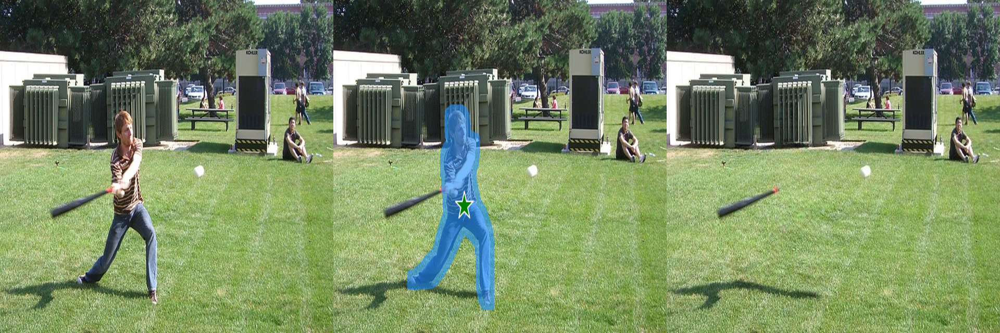

In [36]:
import cv2
import numpy as np
from IPython.display import display, Image as IPImage
from PIL import Image

def show_image_grid_with_cv2(img_paths, cols=3, target_size=(640, 640)):
    """
    Display a grid of images using OpenCV and IPython display, resizing images to the target size.

    Args:
        img_paths (list): List of image paths.
        cols (int): Number of columns in the grid.
        target_size (tuple): Size to which each image will be resized.
    """
    images = []
    for img_path in img_paths:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        img = cv2.resize(img, target_size)  # Resize to target size
        images.append(img)

    n_images = len(images)
    rows = (n_images // cols) + int(n_images % cols != 0)

    # Create a blank canvas for the grid
    img_height, img_width = target_size
    grid_height = img_height * rows
    grid_width = img_width * cols
    grid = np.zeros((grid_height, grid_width, 3), dtype=np.uint8)

    # Place images into the grid
    for idx, img in enumerate(images):
        row = idx // cols
        col = idx % cols
        grid[row * img_height: (row + 1) * img_height, col * img_width: (col + 1) * img_width, :] = img

    # Convert the grid to an image and display it
    grid_image = Image.fromarray(grid)
    display(grid_image)

# Example usage:
image_paths = ["/content/baseball.jpg", "/content/output/baseball/with_mask_0.png", "/content/output/baseball.jpg"]
show_image_grid_with_cv2(image_paths, cols=3, target_size=(640, 640))

In [37]:
# first we have to generate 3 masks
# then we have to generate 3 final inpainted images
# we have to write a function for that

In [38]:
def inpaint_and_save(image_path, mask_path, config_p, ckpt_p, output_dir="/content/output/", mask_idx=0):
    """
    Load an image and mask, perform inpainting using LaMa, and save the output.

    Args:
        image_path (str): Path to the input image.
        mask_path (str): Path to the input mask (2D binary mask).
        config_p (str): Path to the LaMa model configuration file.
        ckpt_p (str): Path to the LaMa model checkpoint directory.
        output_dir (str): Directory to save the output image.
        mask_idx (int): Index of the mask (used to make filenames unique).
    """
    # Load image and mask
    img = Image.open(image_path).convert("RGB")
    mask = Image.open(mask_path).convert("L")

    # Resize the mask to match the image size (if needed)
    mask = mask.resize(img.size, resample=Image.NEAREST)

    img = np.array(img)
    mask = np.array(mask)

    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Perform inpainting using LaMa
    inpainted_img = inpaint_img_with_lama(img, mask, config_p, ckpt_p)

    # Save the inpainted image with a unique filename
    base_name = os.path.basename(image_path)
    output_filename = f"{os.path.splitext(base_name)[0]}_inpainted_mask_{mask_idx}.jpg"
    output_path = os.path.join(output_dir, output_filename)

    Image.fromarray(inpainted_img).save(output_path)
    print(f"Inpainted image saved at: {output_path}")

In [39]:
def mask_and_inpaint(img_path, latest_coords, point_labels=1,
                     config_p="/content/lama/configs/prediction/default.yaml",
                     ckpt_p="/content/Inpaint-Anything/pretrained_models/big-lama",
                     output_dir="/content/output/", dilate_kernel_size=15):
    """
    Generate masks using SAM, perform inpainting for each mask, and save the outputs.

    Args:
        img_path (str): Path to the input image.
        latest_coords (torch.Tensor): Tensor of coordinates for SAM input.
        point_labels (torch.Tensor): Tensor of point labels.
        config_p (str): Path to LaMa model configuration file.
        ckpt_p (str): Path to LaMa model checkpoint directory.
        output_dir (str): Directory to save outputs.
        dilate_kernel_size (int, optional): Kernel size for mask dilation.
    """
    # Load the image as an array
    img_array = load_img_to_array(img_path)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Predict masks using SAM (this function should be defined in your project)
    masks, _, _ = predict_masks_with_sam(
        img_array,
        latest_coords.unsqueeze(0),  # Shape: (1, 1, 2)
        point_labels.unsqueeze(0),   # Shape: (1, 1)
        device=device,
    )

    # Dilate mask if required
    if dilate_kernel_size is not None:
        masks = [dilate_mask(mask, dilate_kernel_size) for mask in masks]

    # Prepare output directories
    img_stem = Path(img_path).stem
    out_dir = Path(output_dir) / img_stem
    out_dir.mkdir(parents=True, exist_ok=True)

    # Save visualizations, masks, and perform inpainting for each mask
    for idx, mask in enumerate(masks):
        mask_p = out_dir / f"mask_{idx}.png"
        img_points_p = out_dir / f"with_points.png"
        img_mask_p = out_dir / f"with_{mask_p.name}"

        # Save the mask as an image
        save_array_to_img(mask, mask_p)

        dpi = plt.rcParams['figure.dpi']
        height, width = img_array.shape[:2]
        plt.figure(figsize=(width / dpi / 0.77, height / dpi / 0.77))
        plt.imshow(img_array)
        plt.axis('off')

        # Flatten coords and labels for plotting
        show_points(plt.gca(), latest_coords.numpy(), point_labels.numpy(), size=(width * 0.04)**2)
        plt.savefig(img_points_p, bbox_inches='tight', pad_inches=2)

        # Show the mask overlay and save
        show_mask(plt.gca(), mask, random_color=False)
        plt.savefig(img_mask_p, bbox_inches='tight', pad_inches=0)
        plt.close()

        # Perform inpainting for the current mask and save the result
        # Pass the original mask_p (not final_mask_path) to inpaint_and_save
        # inpaint_and_save(image_path, str(mask_path), config_p, ckpt_p)
        inpaint_and_save(img_path, str(mask_p), config_p, ckpt_p, output_dir=str(out_dir), mask_idx=idx)

In [40]:
img_path = "/content/baseball.jpg"
latest_coords = torch.tensor([[250, 250]], dtype=torch.float32)
point_labels = torch.tensor([1], dtype=torch.int64)
config_p = "/content/lama/configs/prediction/default.yaml"
ckpt_p = "/content/Inpaint-Anything/pretrained_models/big-lama"
output_dir = "/content/output"

# Call the function to perform masking and inpainting
mask_and_inpaint(img_path, latest_coords, point_labels, config_p, ckpt_p, output_dir)

Inpainted image saved at: /content/output/baseball/baseball_inpainted_mask_0.jpg
Inpainted image saved at: /content/output/baseball/baseball_inpainted_mask_1.jpg
Inpainted image saved at: /content/output/baseball/baseball_inpainted_mask_2.jpg


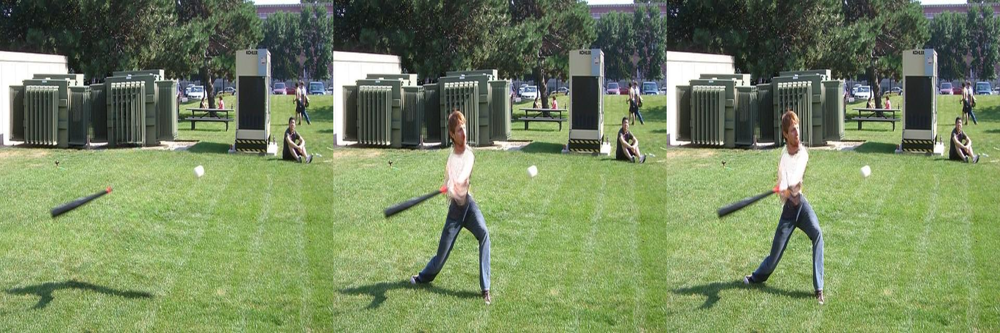

In [41]:
image_paths = ["/content/output/baseball.jpg", "/content/output/baseball/baseball_inpainted_mask_1.jpg", "/content/output/baseball/baseball_inpainted_mask_2.jpg"]
show_image_grid_with_cv2(image_paths, cols=3, target_size=(640, 640))

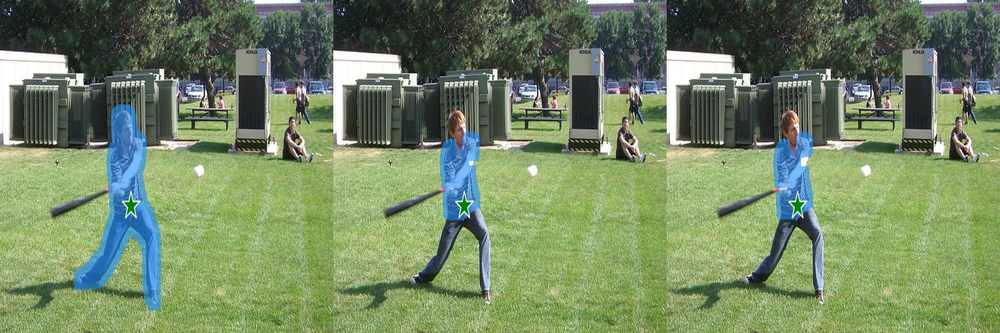

In [42]:
image_paths = ["/content/output/baseball/with_mask_0.png", "/content/output/baseball/with_mask_1.png", "/content/output/baseball/with_mask_2.png"]
show_image_grid_with_cv2(image_paths, cols=3, target_size=(640, 640))

In [ ]:
import shutil
def delete_folder(folder_path):
    """Deletes folder and its contents recursively."""
    try:
        shutil.rmtree(folder_path)
        print(f"Folder '{folder_path}' deleted successfully.")
    except FileNotFoundError:
        print(f"Folder '{folder_path}' not found.")
    except Exception as e:
        print(f"Error deleting folder: {e}")


delete_folder('/content/output/baseball')

# Exporting to ONNX

In [9]:
!chmod +x /content/sam2/checkpoints/download_ckpts.sh
!/content/sam2/checkpoints/download_ckpts.sh

--2025-03-30 13:23:52--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.51, 3.163.189.96, 3.163.189.14, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.51|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156008466 (149M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2.1_hiera_tiny.pt’

sam2.1_hiera_tiny.p 100%[===================>] 148.78M   303MB/s    in 0.5s    

2025-03-30 13:23:53 (303 MB/s) - ‘sam2.1_hiera_tiny.pt’ saved [156008466/156008466]

--2025-03-30 13:23:53--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.51, 3.163.189.96, 3.163.189.14, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.51|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 184416285 (176M) [applicat

In [44]:
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 99.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.4 MB/s eta 0:00:00


In [45]:
import os
import torch
import numpy as np
import onnxruntime as ort
import yaml
from omegaconf import OmegaConf
from saicinpainting.evaluation.utils import move_to_device
from saicinpainting.training.trainers import load_checkpoint
from saicinpainting.evaluation.data import pad_tensor_to_modulo

def export_lama_to_onnx(config_p: str, ckpt_p: str, onnx_path: str, mod=8, device="cpu"):
    """
    Export LaMa model to ONNX format.
    """
    predict_config = OmegaConf.load(config_p)
    predict_config.model.path = ckpt_p

    device = torch.device(device)
    train_config_path = os.path.join(predict_config.model.path, 'config.yaml')
    with open(train_config_path, 'r') as f:
        train_config = OmegaConf.create(yaml.safe_load(f))

    train_config.training_model.predict_only = True
    train_config.visualizer.kind = 'noop'

    checkpoint_path = os.path.join(predict_config.model.path, 'models', predict_config.model.checkpoint)
    model = load_checkpoint(train_config, checkpoint_path, strict=False, map_location='cpu')
    model.freeze()
    model.to(device)

    img = torch.randn(1, 3, 512, 512, device=device)
    mask = torch.randn(1, 1, 512, 512, device=device)

    # # Create a dictionary to hold the image and mask as inputs
    # input_data = {
    #     "image": img,
    #     "mask": mask
    # }

    input_names = ["input_image", "input_mask"]
    output_names = ["output_image"]
    dynamic_axes = {
        "input_image": {0: "batch_size"},
        "input_mask": {0: "batch_size"},
        "output_image": {0: "batch_size"}
    }

    # Pass the input_data dictionary to torch.onnx.export
    torch.onnx.export(
        model,
        (img,mask),  # Pass the dictionary containing inputs
        onnx_path,
        export_params=True,
        input_names=input_names,
        output_names=output_names,
        dynamic_axes=dynamic_axes,
        opset_version=11,
        verbose=True
    )
    print(f"Model exported to {onnx_path}")


def run_lama_onnx(onnx_path: str, img: np.ndarray, mask: np.ndarray, mod=8, device="cpu"):
    """
    Run inference using exported ONNX LaMa model.
    """
    ort_session = ort.InferenceSession(onnx_path, providers=["CUDAExecutionProvider" if device == "cuda" else "CPUExecutionProvider"])

    img = torch.from_numpy(img).float().div(255.).permute(2, 0, 1).unsqueeze(0)
    mask = torch.from_numpy(mask).float().unsqueeze(0).unsqueeze(0)

    img = pad_tensor_to_modulo(img, mod).numpy()
    mask = pad_tensor_to_modulo(mask, mod).numpy()

    outputs = ort_session.run(None, {"input_image": img, "input_mask": mask})
    output_img = outputs[0].squeeze().transpose(1, 2, 0)
    output_img = np.clip(output_img * 255, 0, 255).astype('uint8')

    return output_img

In [46]:
config_p = "/content/lama/configs/prediction/default.yaml"
ckpt_p = "/content/Inpaint-Anything/pretrained_models/big-lama"
onnx_path = "content/onnx"
export_lama_to_onnx(config_p,ckpt_p,onnx_path)

TypeError: DefaultInpaintingTrainingModule.forward() takes 2 positional arguments but 3 were given

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

class SAM2Wrapper(nn.Module):
    def __init__(self, model_cfg: str, checkpoint: str, device="cpu"):
        super(SAM2Wrapper, self).__init__()
        # Build SAM2 model and predictor once
        self.sam2_model = build_sam2(model_cfg, checkpoint, device=device)
        self.predictor = SAM2ImagePredictor(self.sam2_model)
        self.device = device

    def forward(self, img, point_coords, point_labels):
        """
        Args:
            img: a tensor representing the image (or a np.ndarray converted to a tensor)
            point_coords: tensor of shape [B, num_points, 2] with coordinates (assumed to be in the same scale as img)
            point_labels: tensor of shape [B, num_points] with label values (e.g. 1 for positive)
        Returns:
            masks, scores, logits as produced by SAM2's prediction.
        """
        # For full ONNX export, all operations must be tensorized.
        # Here we assume that 'img' is already in an appropriate format.
        # In the official predictor, set_image() does some preprocessing,
        # so ideally you would implement those steps in torch.
        #
        # For demonstration, we call the predictor's methods directly.
        # (Be aware that SAM2ImagePredictor.set_image() and predict() may use Python operations that are not traceable.)
        self.predictor.set_image(img)

        # Call predict; note that the real implementation may require more careful handling
        masks, scores, logits = self.predictor.predict(
            point_coords=point_coords,
            point_labels=point_labels,
            multimask_output=True,
        )

        # Sorting outputs by scores descending.
        # For ONNX export, replace np.argsort with torch.sort.
        # Here, we convert scores to a torch tensor (if they are numpy arrays).
        if not torch.is_tensor(scores):
            scores = torch.tensor(scores, device=self.device)
            masks = torch.tensor(masks, device=self.device)
            logits = torch.tensor(logits, device=self.device)

        # Get sorted indices (descending order)
        sorted_scores, sorted_indices = torch.sort(scores, descending=True)
        masks = masks[sorted_indices]
        logits = logits[sorted_indices]

        return masks, sorted_scores, logits

# Example usage:
device = "cpu"  # or "cuda" if available
# Paths to configuration and checkpoint
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
checkpoint = "../checkpoints/sam2.1_hiera_large.pt"

# Create the unified model wrapper
model = SAM2Wrapper(model_cfg, checkpoint, device=device)
model.to(device)
model.eval()

# Dummy inputs:
# Assume an image tensor of shape [1, 3, H, W]; here H and W should be whatever SAM2ImagePredictor expects.
dummy_img = torch.randn(1, 3, 1024, 1024, device=device)
# Assume one prompt per image (1 point), with coordinates and label.
dummy_point_coords = torch.tensor([[[321.0, 230.0]]], device=device)  # shape: [1, 1, 2]
dummy_point_labels = torch.tensor([[1.0]], device=device)               # shape: [1, 1]

# Run the unified forward pass
masks, scores, logits = model(dummy_img, dummy_point_coords, dummy_point_labels)
print("Masks shape:", masks.shape)
print("Scores:", scores)
print("Logits shape:", logits.shape)

In [49]:
dummy_img = torch.randn(1, 3, 800, 600, device=device)
dummy_point_coords = torch.tensor([[[321.0, 230.0]]], device=device)
dummy_point_labels = torch.tensor([[1.0]], device=device)

torch.onnx.export(
    model_wrapper,
    (dummy_img, dummy_point_coords, dummy_point_labels),
    "sam_full_pipeline.onnx",
    export_params=True,
    opset_version=11,
    input_names=["image", "point_coords", "point_labels"],
    output_names=["masks", "scores", "logits"],
    dynamic_axes={
        "image": {0: "batch_size"},
        "point_coords": {0: "batch_size", 1: "num_points"},
        "point_labels": {0: "batch_size", 1: "num_points"},
    },
    verbose=True,
)


<ipython-input-48-b589931bd105>:25: TracerWarning: Converting a tensor to a NumPy array might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  img_np = img.cpu().numpy().transpose(0, 2, 3, 1)  # Assuming img is in [B, C, H, W] format


RuntimeError: Tried to trace <__torch__.torch.nn.modules.container.Sequential object at 0x47a377e0> but it is not part of the active trace. Modules that are called during a trace must be registered as submodules of the thing being traced.

In [10]:
%cp /content/sam2/sam2/configs/sam2.1/sam2.1_hiera_b+.yaml /content/sam2
%cp /content/sam2/sam2/configs/sam2.1/sam2.1_hiera_l.yaml /content/sam2
%cp /content/sam2/sam2/configs/sam2.1/sam2.1_hiera_s.yaml /content/sam2
%cp /content/sam2/sam2/configs/sam2.1/sam2.1_hiera_t.yaml /content/sam2

In [11]:
%mv /content/sam2.1_hiera_base_plus.pt /content/sam2/checkpoints
%mv /content/sam2.1_hiera_large.pt /content/sam2/checkpoints
%mv /content/sam2.1_hiera_small.pt /content/sam2/checkpoints
%mv /content/sam2.1_hiera_tiny.pt /content/sam2/checkpoints

In [12]:
%mv /export_onnx.py /content/sam2
%mv /david-tomaseti-Vw2HZQ1FGjU-unsplash.jpg /content/sam2

In [45]:
%cd ..

/content


In [52]:
# !python export_onnx.py --outdir /content/ --config --mode export
import os
import sys
sys.path.append("/content/sam2/")
from export_onnx import main
model_idx = 0
model_type = ["tiny","small","base_plus","large"][model_idx]
config_type = ["t","s","b+","l"][model_idx]
version_idx = 1
version_type = ["2","2.1"][version_idx]
onnx_output_path = "checkpoints/sam{}_{}/".format(version_type, model_type)
model_config_file = "sam{}_hiera_{}.yaml".format(version_type, config_type)
model_checkpoints_file = "checkpoints/sam{}_hiera_{}.pt".format(version_type, model_type)
if not os.path.exists(onnx_output_path):
    os.makedirs(onnx_output_path)
arg_list = [
    '--outdir', onnx_output_path,
    '--config', 'configs/sam2.1/sam2.1_hiera_b+.yaml', # Changed the path to a relative path from the current working directory
    '--checkpoint', "/content/sam2/checkpoints/sam2.1_hiera_base_plus.pt",
    '--mode', 'export',
    '--image', 'david-tomaseti-Vw2HZQ1FGjU-unsplash.jpg'
]
main(arg_list)

configs/sam2.1/sam2.1_hiera_b+.yaml
/content/sam2/checkpoints/sam2.1_hiera_base_plus.pt


/content/sam2/sam2/modeling/backbones/utils.py:30: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if pad_h > 0 or pad_w > 0:
/content/sam2/sam2/modeling/backbones/utils.py:58: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if Hp > H or Wp > W:
/content/sam2/sam2/modeling/sam/mask_decoder.py:203: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs

In [55]:
# !python export_onnx.py --outdir /content/ --config --mode export
import os
import sys
sys.path.append("/content/sam2/")
from export_onnx import main
model_idx = 0
model_type = ["tiny","small","base_plus","large"][model_idx]
config_type = ["t","s","b+","l"][model_idx]
version_idx = 1
version_type = ["2","2.1"][version_idx]
onnx_output_path = "checkpoints/sam{}_{}/".format(version_type, model_type)
model_config_file = "sam{}_hiera_{}.yaml".format(version_type, config_type)
model_checkpoints_file = "checkpoints/sam{}_hiera_{}.pt".format(version_type, model_type)
if not os.path.exists(onnx_output_path):
    os.makedirs(onnx_output_path)
arg_list = [
    '--outdir', onnx_output_path,
    '--config', 'configs/sam2.1/sam2.1_hiera_b+.yaml', # Changed the path to a relative path from the current working directory
    '--checkpoint', "/content/sam2/checkpoints/sam2.1_hiera_base_plus.pt",
    '--mode', 'import',
    '--image', '/content/sam2/david-tomaseti-Vw2HZQ1FGjU-unsplash.jpg'
]
main(arg_list)

[1, 3, 1024, 1024]
['input']
['image_embeddings', 'high_res_features1', 'high_res_features2']
encoder start
infer time: 12046.23 ms
['image_embeddings', 'high_res_features1', 'high_res_features2', 'point_coords', 'point_labels', 'mask_input', 'has_mask_input', 'orig_im_size']
['masks', 'iou_predictions', 'low_res_masks']
decoder start
infer time: 238.28 ms
decoder start
infer time: 112.02 ms
decoder start
infer time: 111.54 ms
decoder start
infer time: 125.41 ms
decoder start
infer time: 111.34 ms
decoder start
infer time: 110.01 ms
decoder start
infer time: 115.69 ms


In [21]:
# !pip install onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 96.4 MB/s eta 0:00:00


In [23]:
!pip install onnxsim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 28.7 MB/s eta 0:00:00
